In [1]:
import warnings #Unterdrückung von Warnungen
warnings.filterwarnings("ignore")

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

import os

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

In [4]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
from folium import Choropleth
from folium.plugins import HeatMap
import datetime
from scipy.stats import norm,skew
from scipy import stats
from sklearn.preprocessing import StandardScaler

In [5]:
data2=pd.read_csv("/content/drive/MyDrive/data/akhisar.csv")

In [6]:
data2.head()

,Date,Time,Latitude,Longitude,Depth(km),Magnitude,Distance(km),Region
0,1/1/2020,16:32:46.03,39.0190,27.8095,17.2,1.3,3.87,KADIDAGI-AKHISAR (MANISA) [West 0.5 km]
1,1/2/2020,04:15:33.22,39.4425,27.9402,4.8,1.5,44.60,AKCAKOY- (BALIKESIR) [West 0.5 km]
2,1/2/2020,12:41:45.71,39.0850,27.5788,0.0,1.7,22.09,EGNEZ-SOMA (MANISA) [North East 3.8 km]
3,1/2/2020,19:17:13.74,39.0443,27.8400,8.7,2.1,1.07,MUSALAR-AKHISAR (MANISA) [North West 1.1 km]
4,1/3/2020,09:20:58.09,39.2660,27.9043,5.0,2.0,24.83,COBANLAR-KIRKAGAC (MANISA) [North East 2.6 km]


In [7]:
data2 = data2.drop(['Region'], axis=1)

In [8]:
data2['Date2']= pd.to_datetime(data2["Date"])

In [9]:
from datetime import datetime

data2['newDate'] = [datetime.strptime(date, '%m/%d/%Y').date() for date in data2['Date']]

In [10]:
from datetime import datetime as dt
import time

def toYearFraction(date):
    def sinceEpoch(date): # returns seconds since epoch
        return time.mktime(date.timetuple())
    s = sinceEpoch

    year = date.year
    startOfThisYear = dt(year=year, month=1, day=1)
    startOfNextYear = dt(year=year+1, month=1, day=1)

    yearElapsed = s(date) - s(startOfThisYear)
    yearDuration = s(startOfNextYear) - s(startOfThisYear)
    fraction = yearElapsed/yearDuration

    return date.year + fraction

In [11]:
data2['newDate2'] = data2['Depth(km)']

In [12]:
a=0
for i in data2['newDate']:    
    data2['newDate2'][a]=toYearFraction(i)
    a = a+1

In [13]:
#data2 = data2.rename(columns={'newDate2': 'FloatedData'})

In [14]:
data2 = data2.drop(data2[data2['Depth(km)'] == 0.0].index)

In [15]:
data2.shape

(7564, 10)

In [16]:
data2.head()

,Date,Time,Latitude,Longitude,Depth(km),Magnitude,Distance(km),Date2,newDate,newDate2
0,1/1/2020,16:32:46.03,39.0190,27.8095,17.2,1.3,3.87,2020-01-01,2020-01-01,2020.000000
1,1/2/2020,04:15:33.22,39.4425,27.9402,4.8,1.5,44.60,2020-01-02,2020-01-02,2020.002732
3,1/2/2020,19:17:13.74,39.0443,27.8400,8.7,2.1,1.07,2020-01-02,2020-01-02,2020.002732
4,1/3/2020,09:20:58.09,39.2660,27.9043,5.0,2.0,24.83,2020-01-03,2020-01-03,2020.005464
5,1/3/2020,09:50:59.51,39.4650,27.9427,5.3,1.8,47.09,2020-01-03,2020-01-03,2020.005464


In [17]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7564 entries, 0 to 7729
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          7564 non-null   object        
 1   Time          7564 non-null   object        
 2   Latitude      7564 non-null   float64       
 3   Longitude     7564 non-null   float64       
 4   Depth(km)     7564 non-null   float64       
 5   Magnitude     7564 non-null   float64       
 6   Distance(km)  7564 non-null   float64       
 7   Date2         7564 non-null   datetime64[ns]
 8   newDate       7564 non-null   object        
 9   newDate2      7564 non-null   float64       
dtypes: datetime64[ns](1), float64(6), object(3)
memory usage: 650.0+ KB


In [18]:
data2['Date2']= pd.to_datetime(data2["Date"])

In [19]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7564 entries, 0 to 7729
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          7564 non-null   object        
 1   Time          7564 non-null   object        
 2   Latitude      7564 non-null   float64       
 3   Longitude     7564 non-null   float64       
 4   Depth(km)     7564 non-null   float64       
 5   Magnitude     7564 non-null   float64       
 6   Distance(km)  7564 non-null   float64       
 7   Date2         7564 non-null   datetime64[ns]
 8   newDate       7564 non-null   object        
 9   newDate2      7564 non-null   float64       
dtypes: datetime64[ns](1), float64(6), object(3)
memory usage: 650.0+ KB


In [20]:
data = data2
data.head()

,Date,Time,Latitude,Longitude,Depth(km),Magnitude,Distance(km),Date2,newDate,newDate2
0,1/1/2020,16:32:46.03,39.0190,27.8095,17.2,1.3,3.87,2020-01-01,2020-01-01,2020.000000
1,1/2/2020,04:15:33.22,39.4425,27.9402,4.8,1.5,44.60,2020-01-02,2020-01-02,2020.002732
3,1/2/2020,19:17:13.74,39.0443,27.8400,8.7,2.1,1.07,2020-01-02,2020-01-02,2020.002732
4,1/3/2020,09:20:58.09,39.2660,27.9043,5.0,2.0,24.83,2020-01-03,2020-01-03,2020.005464
5,1/3/2020,09:50:59.51,39.4650,27.9427,5.3,1.8,47.09,2020-01-03,2020-01-03,2020.005464


In [21]:
data.isnull().any()

Date            False
Time            False
Latitude        False
Longitude       False
Depth(km)       False
Magnitude       False
Distance(km)    False
Date2           False
newDate         False
newDate2        False
dtype: bool

In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7564 entries, 0 to 7729
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          7564 non-null   object        
 1   Time          7564 non-null   object        
 2   Latitude      7564 non-null   float64       
 3   Longitude     7564 non-null   float64       
 4   Depth(km)     7564 non-null   float64       
 5   Magnitude     7564 non-null   float64       
 6   Distance(km)  7564 non-null   float64       
 7   Date2         7564 non-null   datetime64[ns]
 8   newDate       7564 non-null   object        
 9   newDate2      7564 non-null   float64       
dtypes: datetime64[ns](1), float64(6), object(3)
memory usage: 650.0+ KB


**Data Analizi**

In [23]:
#plotting a lineplot with magnitudes with respect to dates
#plt.figure(figsize=(12,8))
#Time_series=sns.lineplot(x=data2['Date2'].dt.year,y="Magnitude",data=data2, color="#ffa600")
#Time_series.set_title("Time Series Of Earthquakes Over Years", color="#58508d")
#Time_series.set_ylabel("magnitude", color="#58508d")
#Time_series.set_xlabel("Date", color="#58508d")

Text(0.5, 0, 'Date')

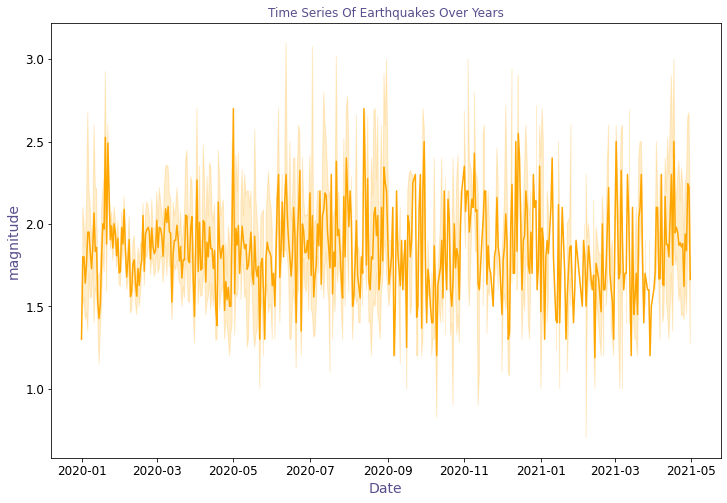

In [24]:
#plotting a lineplot with magnitudes with respect to dates
plt.figure(figsize=(12,8))
Time_series=sns.lineplot(x="Date2",y="Magnitude",data=data2, color="#ffa600")
Time_series.set_title("Time Series Of Earthquakes Over Years", color="#58508d")
Time_series.set_ylabel("magnitude", color="#58508d")
Time_series.set_xlabel("Date", color="#58508d")

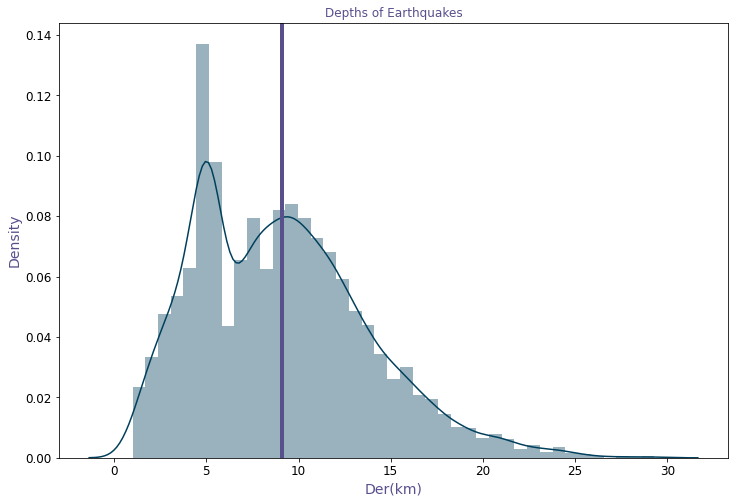

In [25]:
#Plotting the depth of earthquake and mean depth

plt.figure(figsize=(12,8))
depth = data2["Depth(km)"].values
mean_D= data2["Depth(km)"].mean()
Depth_plot = sns.distplot(depth, color ="#003f5c")
Depth_plot.set_title("Depths of Earthquakes", color="#58508d")
Depth_plot.set_ylabel("Density", color="#58508d")
Depth_plot.set_xlabel("Der(km)", color="#58508d")

plt.axvline(mean_D,0,1, color="#58508d",linewidth=4,label="Mean")

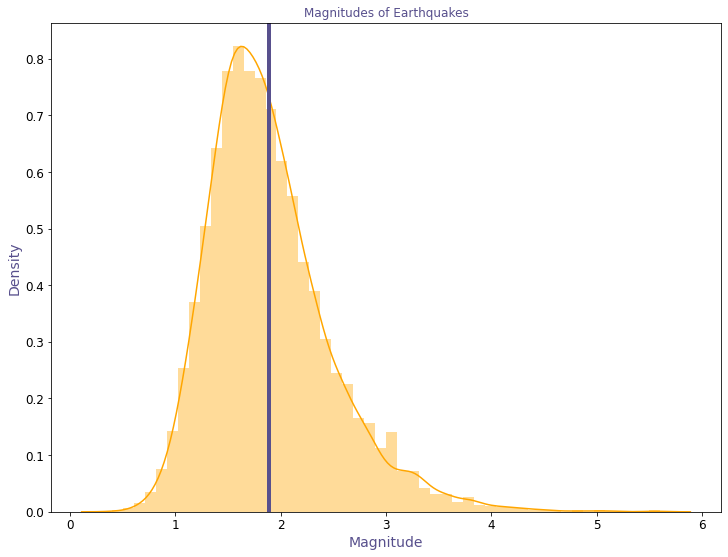

In [26]:
plt.figure(figsize=(12,9))
strength = data2["Magnitude"].values
mean_M= data2["Magnitude"].mean()
Magnitude_plot = sns.distplot(strength, color ="#ffa600")
Magnitude_plot.set_title("Magnitudes of Earthquakes", color="#58508d")
Magnitude_plot.set_ylabel("Density", color="#58508d")
Magnitude_plot.set_xlabel("Magnitude", color="#58508d")

plt.axvline(mean_M,0,1, color="#58508d",linewidth=4,label="Mean")

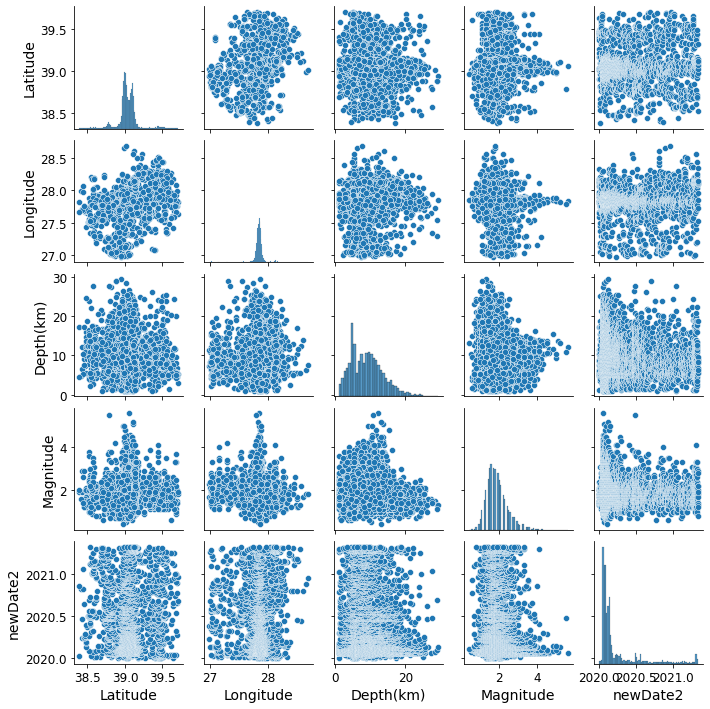

In [27]:
cols=['Latitude','Longitude','Depth(km)', 'Magnitude', 'Date2', 'newDate2']
sns.pairplot(data[cols],height = 2)

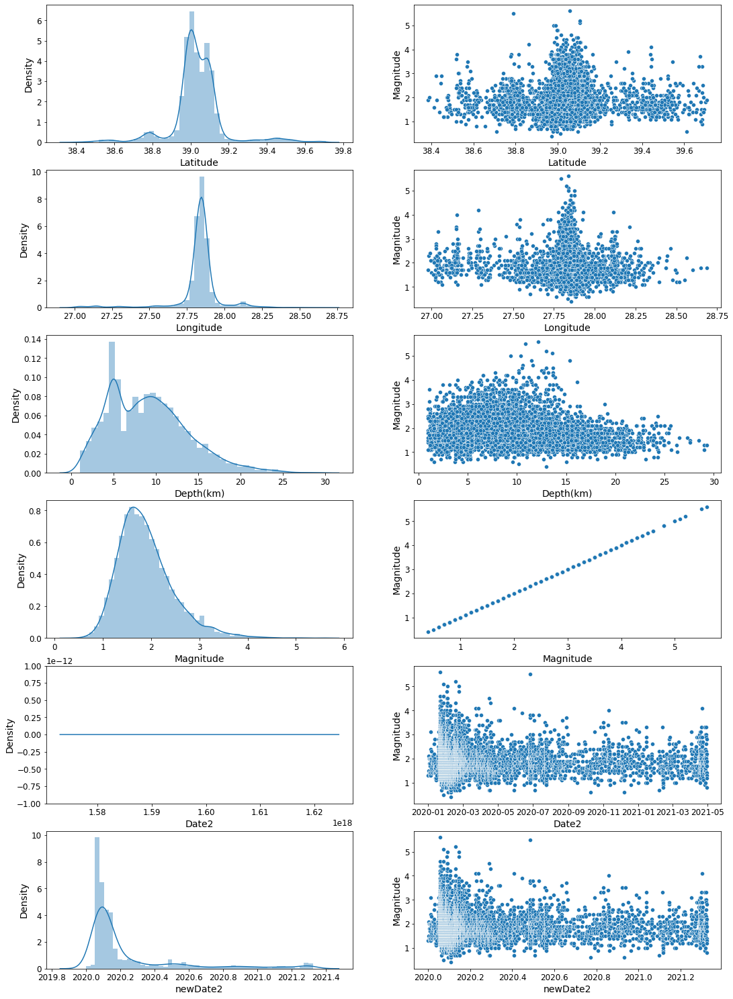

In [28]:
plt.figure(figsize=(18,40))
for idx, f in enumerate(['Latitude','Longitude','Depth(km)', 'Magnitude', 'Date2', 'newDate2']):
    plt.subplot(9,2,2*idx+1)
    sns.distplot(data[f])
    plt.subplot(9,2,2*idx+2)
    sns.scatterplot(x=f,y='Magnitude',data =data2)

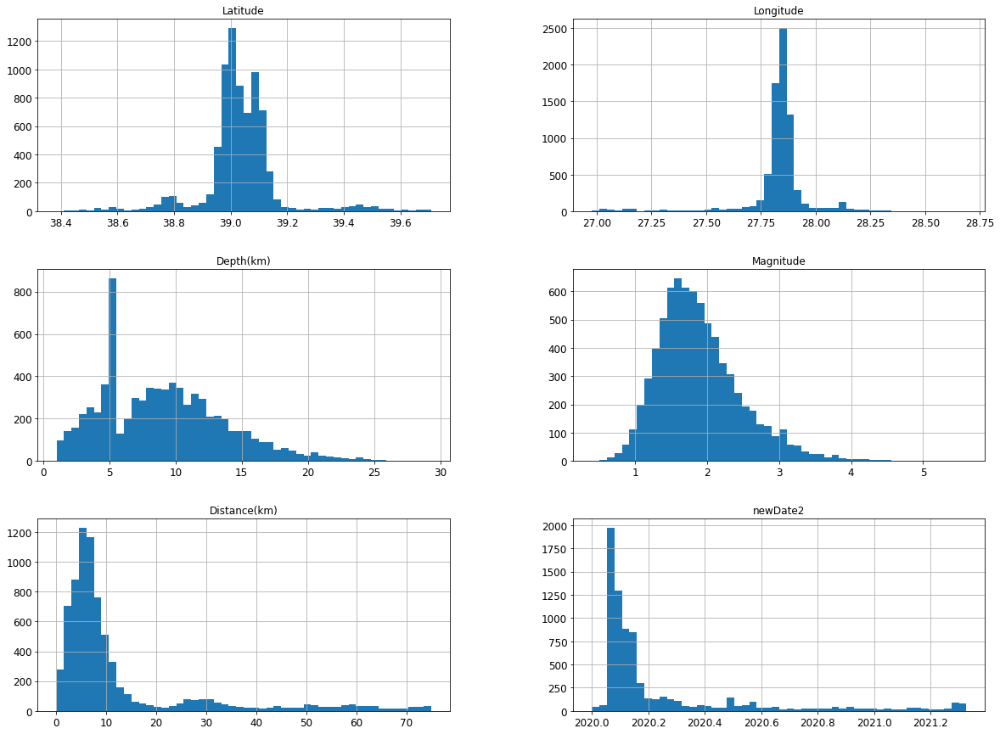

In [29]:
%matplotlib inline
import matplotlib.pyplot as plt
data2.hist(bins=50, figsize=(20,15))
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fde36979110>,
      dtype=object)

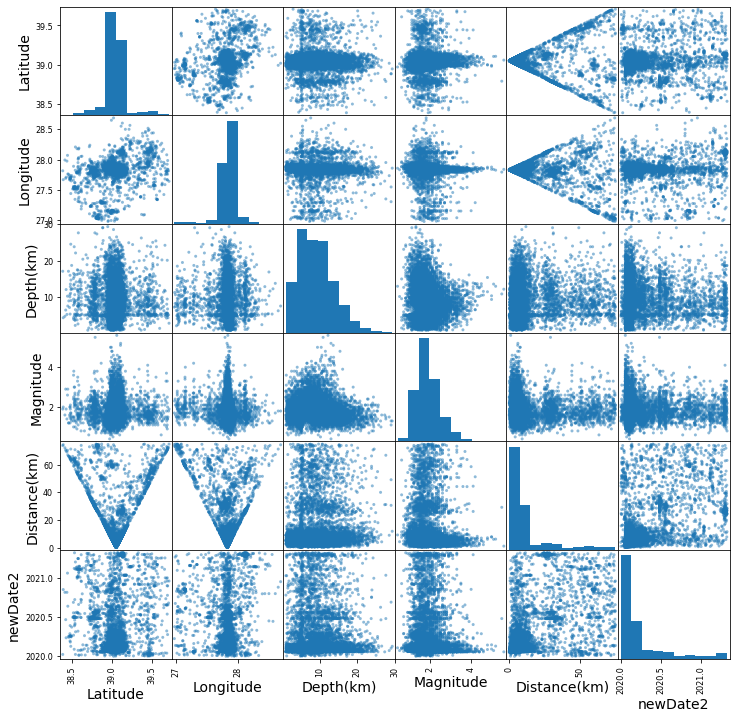

In [30]:
from pandas.plotting import scatter_matrix
scatter_matrix(data2, figsize=(12, 12))

Text(0.5, 1.0, 'Correlation between different fearures')

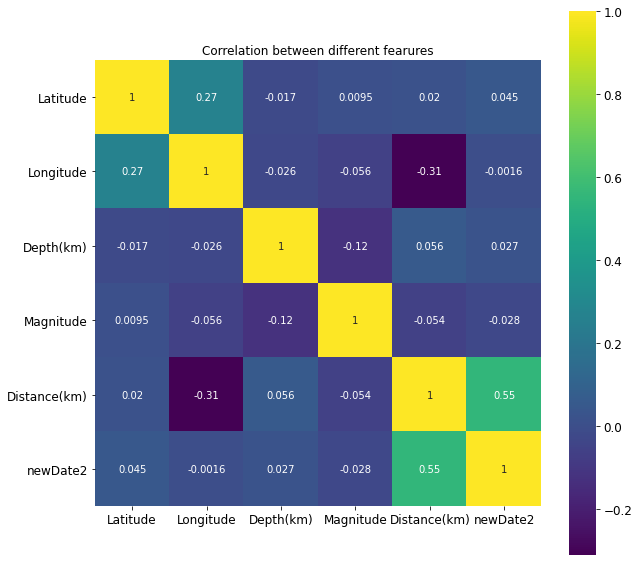

In [31]:
correlation = data2.corr()
plt.figure(figsize=(10,10))
sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='viridis')

plt.title('Correlation between different fearures')

In [32]:
cor=data2.corr()
cor

,Latitude,Longitude,Depth(km),Magnitude,Distance(km),newDate2
Latitude,1.000000,0.271920,-0.016809,0.009463,0.019957,0.045260
Longitude,0.271920,1.000000,-0.026266,-0.056228,-0.309425,-0.001591
Depth(km),-0.016809,-0.026266,1.000000,-0.121901,0.055962,0.027016
Magnitude,0.009463,-0.056228,-0.121901,1.000000,-0.053867,-0.028076
Distance(km),0.019957,-0.309425,0.055962,-0.053867,1.000000,0.551072
newDate2,0.045260,-0.001591,0.027016,-0.028076,0.551072,1.000000


**Silhouette latitude-longitude**

In [33]:
import numpy as np
import pandas as pd

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

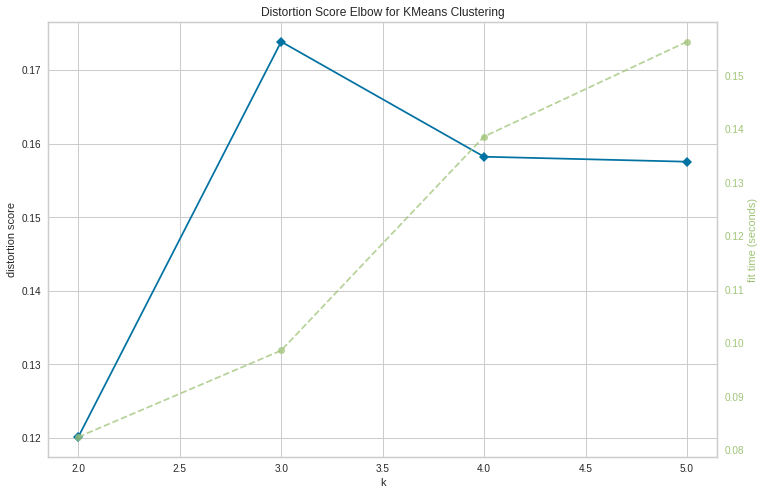

In [34]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

fig = plt.figure(figsize=(12,8))

# KNears Neighbors 
data.head()

X = data2[["Longitude", "Latitude"]]


# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,6))

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof() 

In [35]:
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

kmeans = KMeans(n_clusters=5)  
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

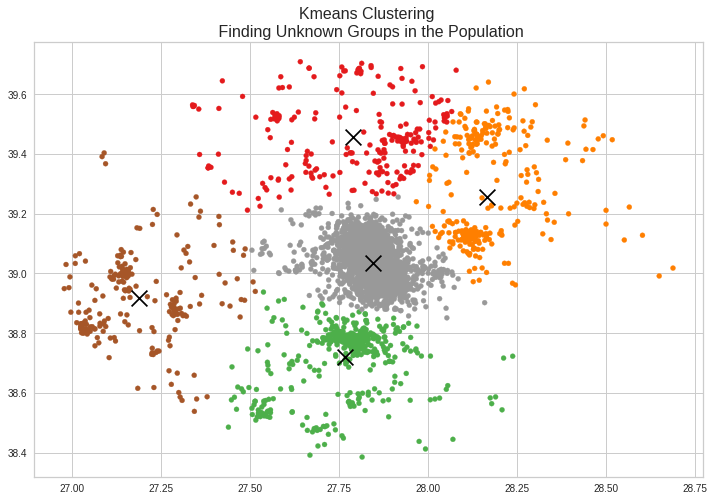

In [36]:
fig = plt.figure(figsize=(12,8))

plt.scatter(X.values[:,0], X.values[:,1], c=kmeans.labels_, cmap="Set1_r", s=25)
plt.scatter(kmeans.cluster_centers_[:,0] ,kmeans.cluster_centers_[:,1], color='black', marker="x", s=250)
plt.title("Kmeans Clustering \n Finding Unknown Groups in the Population", fontsize=16)
plt.show()

In [37]:
import folium
from folium import plugins

n = folium.Map(location=[38,34], tiles="OpenStreetMap", zoom_start=6,  width="%100",
height="%100",)

    
for index, row in data2.iterrows():
    folium.CircleMarker(location=[((row["Latitude"])), ((row["Longitude"]))], radius=0.3, color='purple').add_to(n)


folium.CircleMarker(location=[38.9, 27.15], radius=5, color='blue',).add_to(n)
folium.CircleMarker(location=[38.7, 27.75], radius=5, color='blue',).add_to(n)
folium.CircleMarker(location=[39.05, 27.80], radius=5, color='blue',).add_to(n)
folium.CircleMarker(location=[39.22, 28.18], radius=5, color='blue',).add_to(n)
folium.CircleMarker(location=[39.45, 27.80], radius=5, color='blue',).add_to(n)

n

In [38]:
# selecting features
x = data2.iloc[:,[2,3]].values

For n_clusters = 2 The average silhouette_score is : 0.7518256949833098
For n_clusters = 3 The average silhouette_score is : 0.7024685527168263
For n_clusters = 4 The average silhouette_score is : 0.6775764078818319
For n_clusters = 5 The average silhouette_score is : 0.4605803406479716
For n_clusters = 6 The average silhouette_score is : 0.4742983233709059
For n_clusters = 7 The average silhouette_score is : 0.48731121328269944
For n_clusters = 8 The average silhouette_score is : 0.49253532573944625
For n_clusters = 9 The average silhouette_score is : 0.49365919211432396
For n_clusters = 10 The average silhouette_score is : 0.5002345040629161


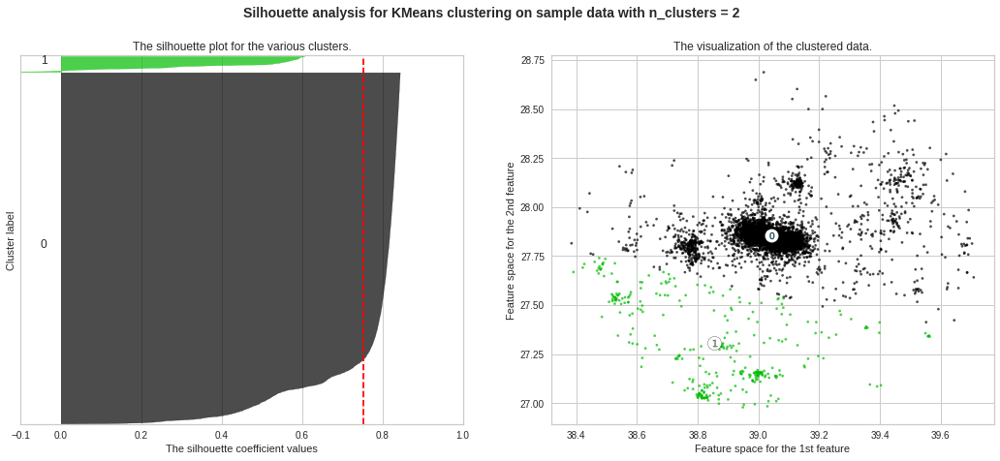

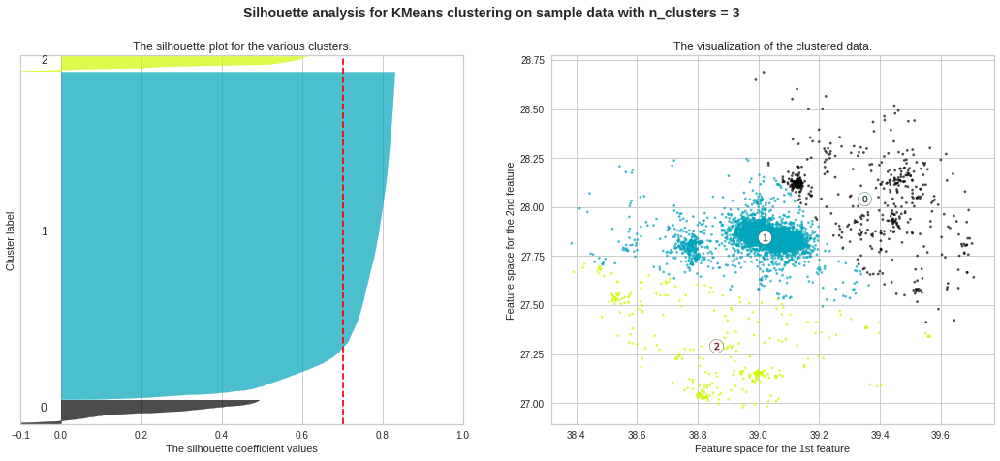

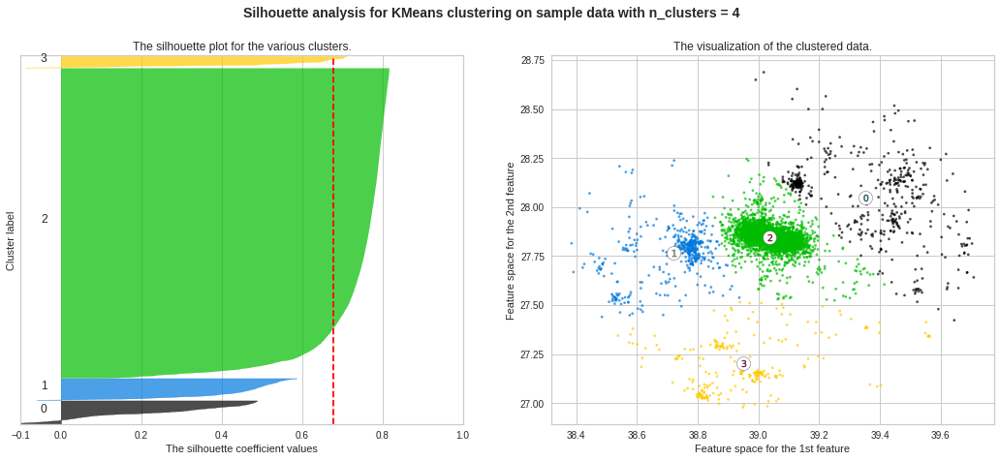

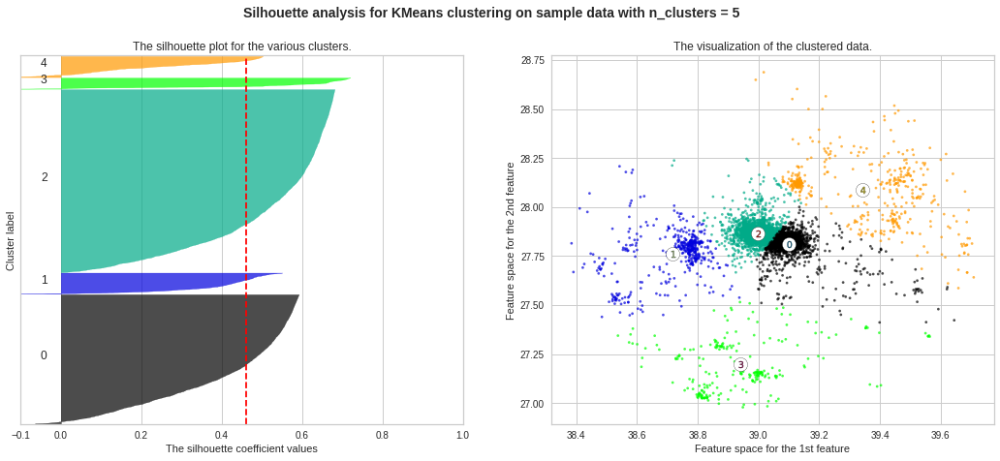

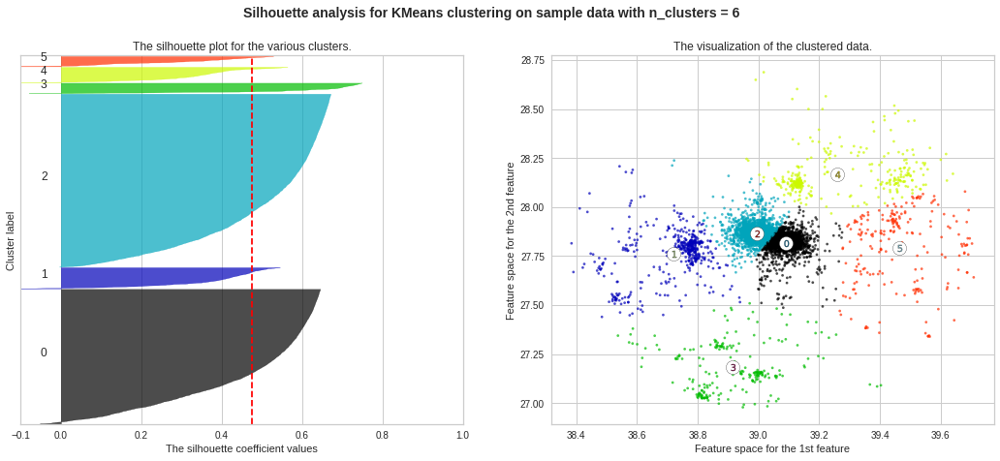

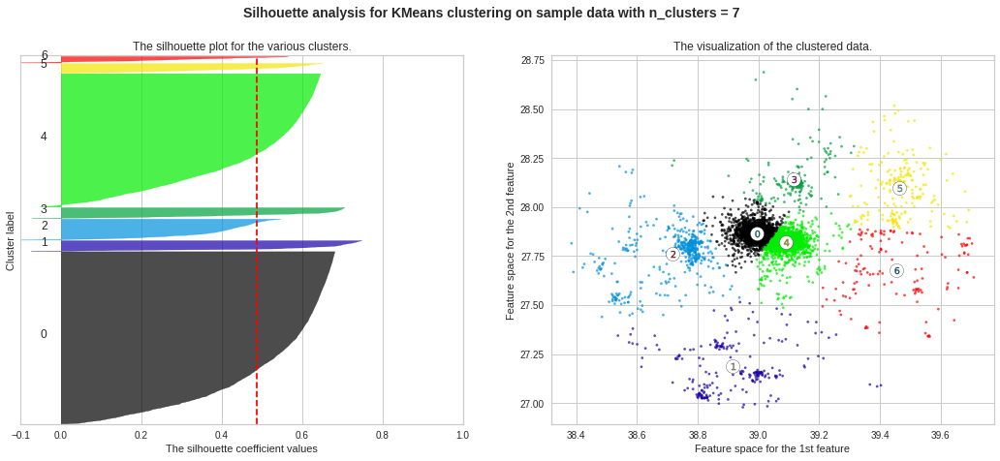

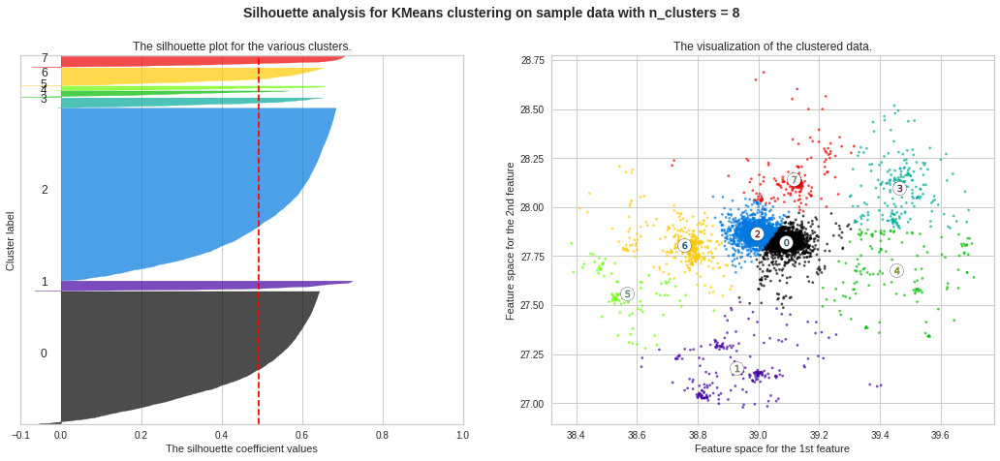

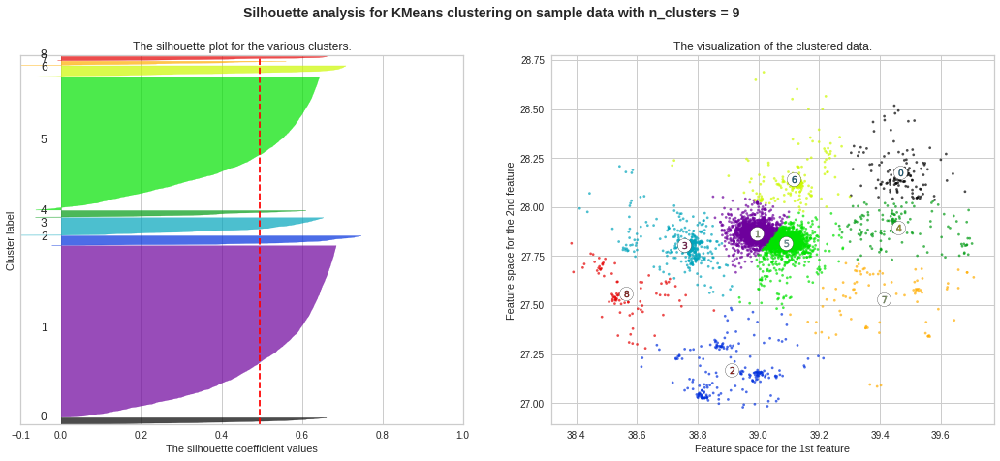

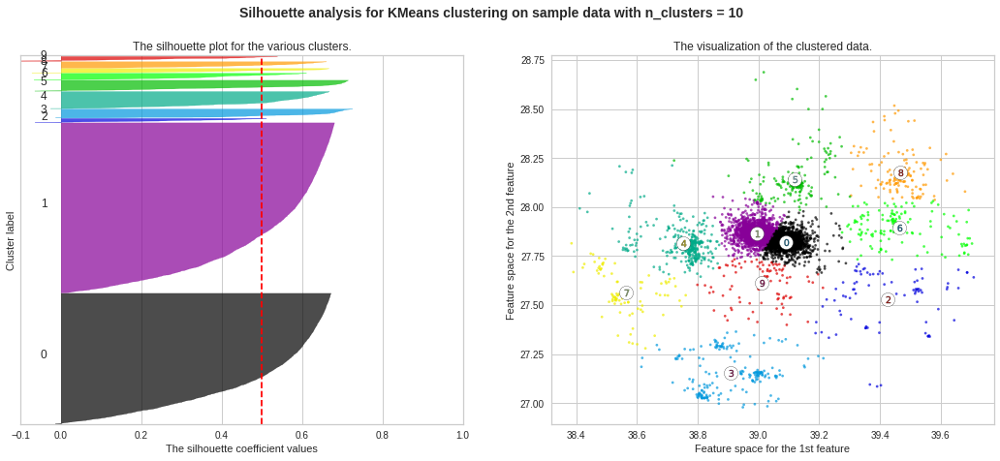

In [39]:
# Silhouette score

for n_clusters in range(2,11):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(x) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(x)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(x, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(x, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(x[:, 0], x[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

**DBSCAN latitude-longitude**

In [152]:
x=data2.iloc[:,[2,3]].values

In [164]:
from sklearn.cluster import DBSCAN
db=DBSCAN(eps=0.123,min_samples=2,metric='euclidean')

In [165]:
model=db.fit(x)

In [166]:
label=model.labels_

In [167]:
from sklearn import metrics

#identifying the points which makes up our core points
sample_cores=np.zeros_like(label,dtype=bool)

sample_cores[db.core_sample_indices_]=True

#Calculating the number of clusters

n_clusters=len(set(label))- (1 if -1 in label else 0)
print('No of clusters:',n_clusters)

No of clusters: 5


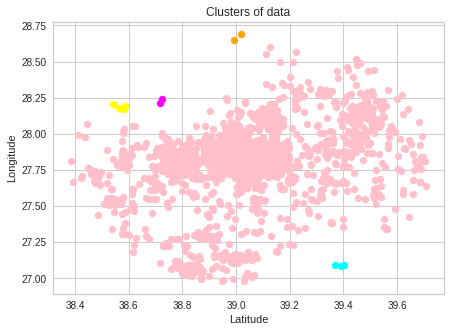

In [168]:
y_means = db.fit_predict(x)
plt.figure(figsize=(7,5))
plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 50, c = 'pink')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 50, c = 'yellow')
plt.scatter(x[y_means == 2, 0], x[y_means == 2, 1], s = 50, c = 'cyan')
plt.scatter(x[y_means == 3, 0], x[y_means == 3, 1], s = 50, c = 'magenta')
plt.scatter(x[y_means == 4, 0], x[y_means == 4, 1], s = 50, c = 'orange')
plt.scatter(x[y_means == 5, 0], x[y_means == 5, 1], s = 50, c = 'blue')
plt.scatter(x[y_means == 6, 0], x[y_means == 6, 1], s = 50, c = 'red')
plt.scatter(x[y_means == 7, 0], x[y_means == 7, 1], s = 50, c = 'black')
plt.scatter(x[y_means == 8, 0], x[y_means == 8, 1], s = 50, c = 'violet')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Clusters of data')
plt.show()

**Silhouette depth-magnitude**

In [46]:
import numpy as np
import pandas as pd

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

In [47]:
data2.head()

,Date,Time,Latitude,Longitude,Depth(km),Magnitude,Distance(km),Date2,newDate,newDate2
0,1/1/2020,16:32:46.03,39.0190,27.8095,17.2,1.3,3.87,2020-01-01,2020-01-01,2020.000000
1,1/2/2020,04:15:33.22,39.4425,27.9402,4.8,1.5,44.60,2020-01-02,2020-01-02,2020.002732
3,1/2/2020,19:17:13.74,39.0443,27.8400,8.7,2.1,1.07,2020-01-02,2020-01-02,2020.002732
4,1/3/2020,09:20:58.09,39.2660,27.9043,5.0,2.0,24.83,2020-01-03,2020-01-03,2020.005464
5,1/3/2020,09:50:59.51,39.4650,27.9427,5.3,1.8,47.09,2020-01-03,2020-01-03,2020.005464


In [48]:
# selecting features
x = data2.iloc[:,[4,5]].values

In [49]:
# Elbow Method

score = []

for cluster in range(1,11):
    kmeans = KMeans(n_clusters = cluster, init="k-means++", random_state=10)
    kmeans.fit(x)
    score.append(kmeans.inertia_)

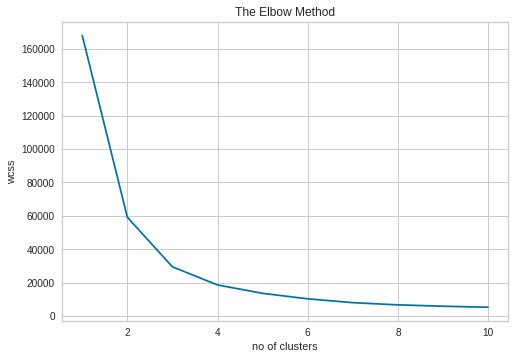

In [50]:
# plotting the score

plt.plot(range(1,11), score)
plt.title('The Elbow Method')
plt.xlabel('no of clusters')
plt.ylabel('wcss')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.5571330214854706
For n_clusters = 3 The average silhouette_score is : 0.5451708241162537
For n_clusters = 4 The average silhouette_score is : 0.5208190757013644
For n_clusters = 5 The average silhouette_score is : 0.49798658997086737
For n_clusters = 6 The average silhouette_score is : 0.47178729863862134
For n_clusters = 7 The average silhouette_score is : 0.4686991099334258
For n_clusters = 8 The average silhouette_score is : 0.454482030265532
For n_clusters = 9 The average silhouette_score is : 0.444697387924283
For n_clusters = 10 The average silhouette_score is : 0.42813189099284366


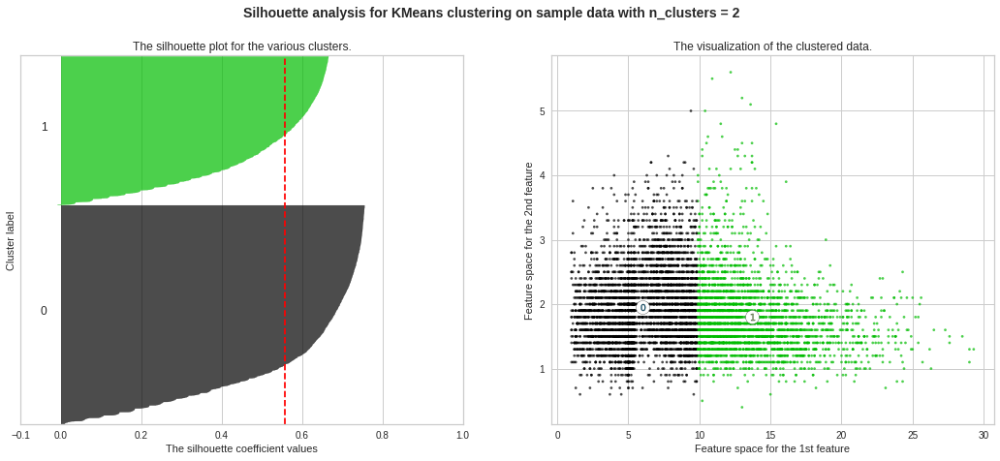

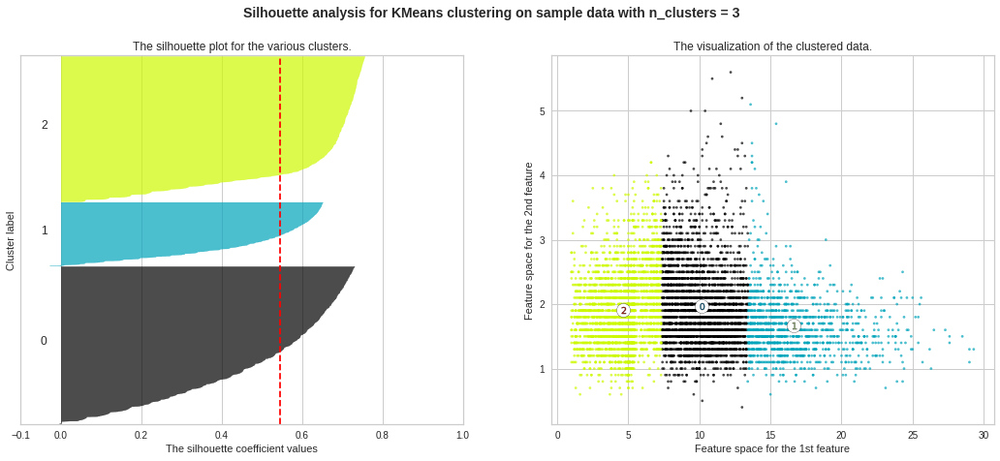

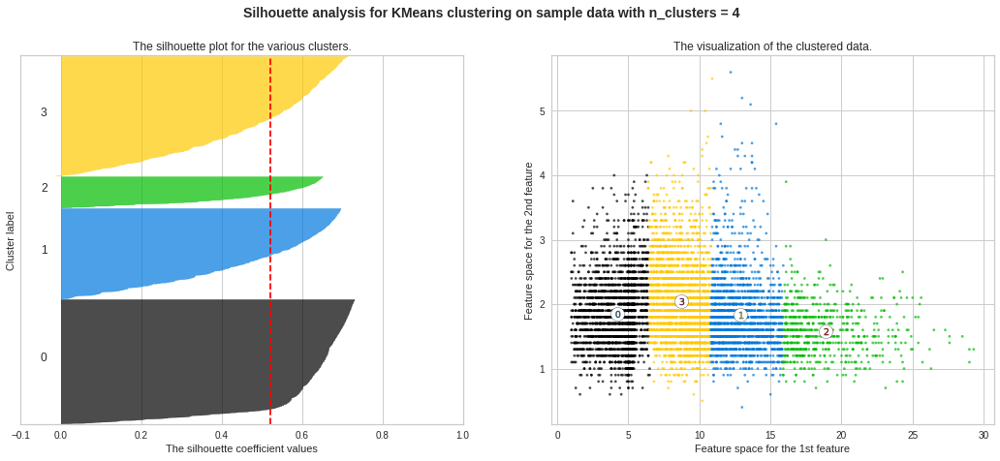

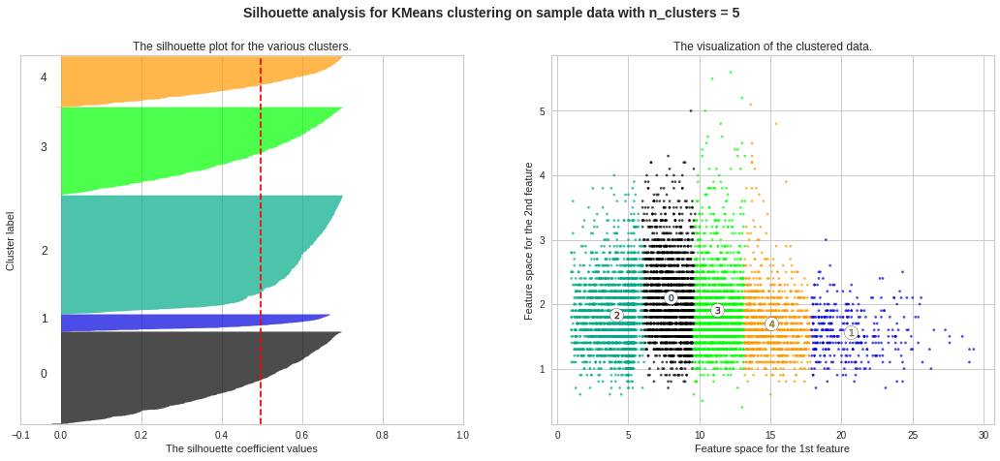

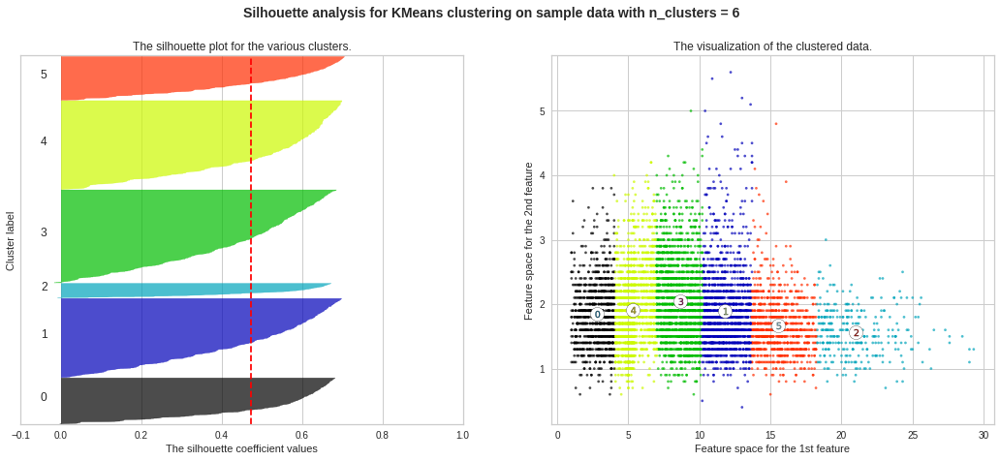

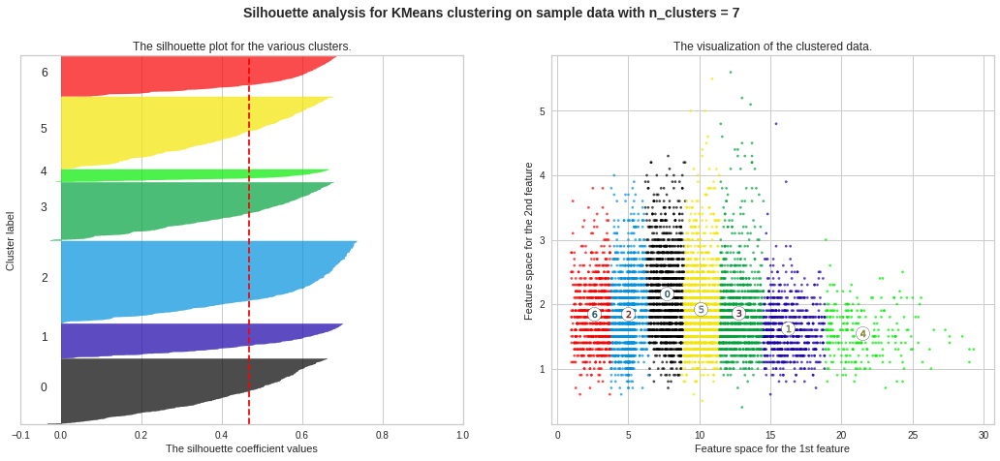

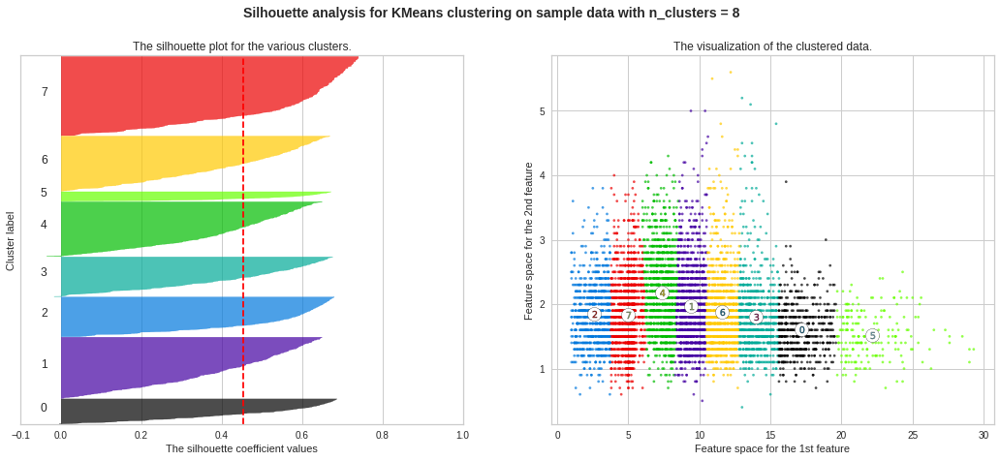

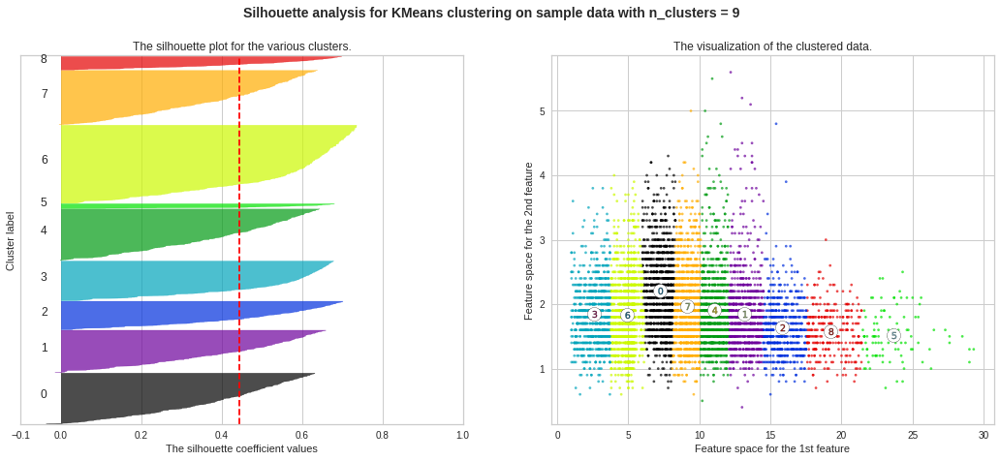

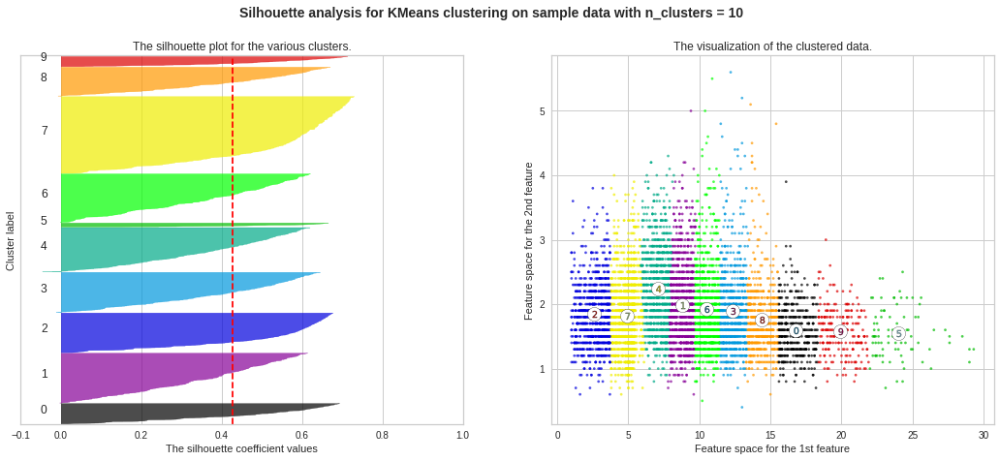

In [51]:
# Silhouette score

for n_clusters in range(2,11):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(x) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(x)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(x, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(x, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(x[:, 0], x[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

**DBSCAN depth-magnitude**

In [52]:
data2.head()

,Date,Time,Latitude,Longitude,Depth(km),Magnitude,Distance(km),Date2,newDate,newDate2
0,1/1/2020,16:32:46.03,39.0190,27.8095,17.2,1.3,3.87,2020-01-01,2020-01-01,2020.000000
1,1/2/2020,04:15:33.22,39.4425,27.9402,4.8,1.5,44.60,2020-01-02,2020-01-02,2020.002732
3,1/2/2020,19:17:13.74,39.0443,27.8400,8.7,2.1,1.07,2020-01-02,2020-01-02,2020.002732
4,1/3/2020,09:20:58.09,39.2660,27.9043,5.0,2.0,24.83,2020-01-03,2020-01-03,2020.005464
5,1/3/2020,09:50:59.51,39.4650,27.9427,5.3,1.8,47.09,2020-01-03,2020-01-03,2020.005464


In [169]:
x=data2.iloc[:,[4,5]].values

In [170]:
x.shape

(7564, 2)

In [187]:
from sklearn.cluster import DBSCAN
db=DBSCAN(eps=0.5,min_samples=2,metric='euclidean')

In [188]:
model=db.fit(x)

In [189]:
label=model.labels_

In [190]:
from sklearn import metrics

#identifying the points which makes up our core points
sample_cores=np.zeros_like(label,dtype=bool)

sample_cores[db.core_sample_indices_]=True

#Calculating the number of clusters

n_clusters=len(set(label))- (1 if -1 in label else 0)
print('No of clusters:',n_clusters)

No of clusters: 5


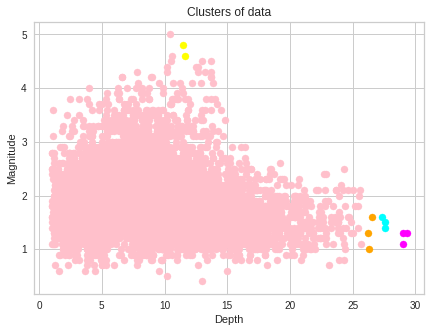

In [191]:
y_means = db.fit_predict(x)
plt.figure(figsize=(7,5))
plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 50, c = 'pink')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 50, c = 'yellow')
plt.scatter(x[y_means == 2, 0], x[y_means == 2, 1], s = 50, c = 'cyan')
plt.scatter(x[y_means == 3, 0], x[y_means == 3, 1], s = 50, c = 'magenta')
plt.scatter(x[y_means == 4, 0], x[y_means == 4, 1], s = 50, c = 'orange')
plt.scatter(x[y_means == 5, 0], x[y_means == 5, 1], s = 50, c = 'blue')
plt.scatter(x[y_means == 6, 0], x[y_means == 6, 1], s = 50, c = 'red')
plt.scatter(x[y_means == 7, 0], x[y_means == 7, 1], s = 50, c = 'black')
plt.scatter(x[y_means == 8, 0], x[y_means == 8, 1], s = 50, c = 'violet')
plt.xlabel('Depth')
plt.ylabel('Magnitude')
plt.title('Clusters of data')
plt.show()

In [60]:
# import the libraries
import numpy as np
import pandas as pd 
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py

**3D Clustering - 2**

In [68]:
data2.head()

,Date,Time,Latitude,Longitude,Depth(km),Magnitude,Distance(km),Date2,newDate,newDate2
0,1/1/2020,16:32:46.03,39.0190,27.8095,17.2,1.3,3.87,2020-01-01,2020-01-01,2020.000000
1,1/2/2020,04:15:33.22,39.4425,27.9402,4.8,1.5,44.60,2020-01-02,2020-01-02,2020.002732
3,1/2/2020,19:17:13.74,39.0443,27.8400,8.7,2.1,1.07,2020-01-02,2020-01-02,2020.002732
4,1/3/2020,09:20:58.09,39.2660,27.9043,5.0,2.0,24.83,2020-01-03,2020-01-03,2020.005464
5,1/3/2020,09:50:59.51,39.4650,27.9427,5.3,1.8,47.09,2020-01-03,2020-01-03,2020.005464


In [69]:
import numpy as np
from sklearn import preprocessing

DF_ARRAY = np.array(data2.iloc[:,3:7])          # Getting only the numeric features from the dataset
DF_NORM  = preprocessing.normalize(DF_ARRAY) # Normalizing the data

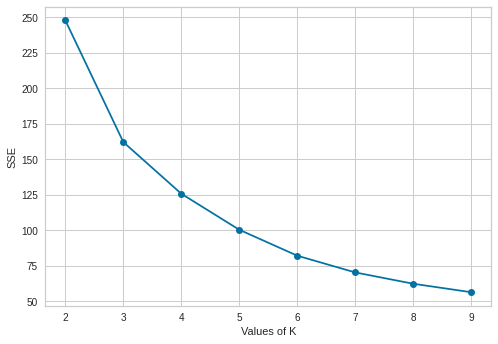

In [70]:
import matplotlib.pyplot as plt

# Amount of values to be tested for K
Ks = range(2, 10)

# List to hold on the metrics for each value of K
results = []

# Executing the loop
for K in Ks:
    
    model = KMeans(n_clusters = K)
    model.fit(DF_NORM)
    
    results.append(model.inertia_)

# Plotting the final result
plt.plot(Ks, results, 'o-')
plt.xlabel("Values of K")
plt.ylabel("SSE")
plt.show()

In [71]:
from sklearn.cluster import KMeans

# Creating our Model
kmeans = KMeans(n_clusters = 4)

# Training our model
kmeans.fit(DF_NORM)

# You can see the labels (clusters) assigned for each data point with the function labels_
kmeans.labels_

# Assigning the labels to the initial dataset
data2['cluster'] = kmeans.labels_

In [72]:
import plotly.graph_objects as go

PLOT = go.Figure()

for C in list(data2.cluster.unique()):
    
    PLOT.add_trace(go.Scatter3d(x = data2[data2.cluster == C]['Latitude'],
                                y = data2[data2.cluster == C]['Longitude'],
                                z = -data2[data2.cluster == C]['Depth(km)'],
                                mode = 'markers', marker_size = 1,
                                name = 'Cluster ' + str(C)))


PLOT.update_layout(width = 800, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'Latitude', titlefont_color = 'black'),
                                yaxis=dict(title = 'Longitude', titlefont_color = 'black'),
                                zaxis=dict(title = 'Depth(km)', titlefont_color = 'black')),
                   font = dict(family = "Gilroy", color  = 'black', size = 12))

In [73]:
import plotly.graph_objects as go

PLOT = go.Figure()

for C in list(data2.cluster.unique()):
    
    PLOT.add_trace(go.Scatter3d(x = data2[data2.cluster == C]['Latitude'],
                                y = data2[data2.cluster == C]['Longitude'],
                                z = data2[data2.cluster == C]['Magnitude'],
                                mode = 'markers', marker_size = 1,
                                
                                name = 'Cluster ' + str(C)))


PLOT.update_layout(width = 800, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'Latitude', titlefont_color = 'black'),
                                yaxis=dict(title = 'Longitude', titlefont_color = 'black'),
                                zaxis=dict(title = 'Magnitude', titlefont_color = 'black'),
                               aspectmode='cube'),
                   font = dict(family = "Gilroy", color  = 'black', size = 12))

renkler büyük ihtimalle bir noktaya olan uzaklıklarına göre verilmiş

In [74]:
data2.head()

,Date,Time,Latitude,Longitude,Depth(km),Magnitude,Distance(km),Date2,newDate,newDate2,cluster
0,1/1/2020,16:32:46.03,39.0190,27.8095,17.2,1.3,3.87,2020-01-01,2020-01-01,2020.000000,3
1,1/2/2020,04:15:33.22,39.4425,27.9402,4.8,1.5,44.60,2020-01-02,2020-01-02,2020.002732,2
3,1/2/2020,19:17:13.74,39.0443,27.8400,8.7,2.1,1.07,2020-01-02,2020-01-02,2020.002732,0
4,1/3/2020,09:20:58.09,39.2660,27.9043,5.0,2.0,24.83,2020-01-03,2020-01-03,2020.005464,1
5,1/3/2020,09:50:59.51,39.4650,27.9427,5.3,1.8,47.09,2020-01-03,2020-01-03,2020.005464,2


unweighted kmeans


In [75]:
# Variable with the Longitude and Latitude
X=data2.loc[:,['Latitude','Longitude','Magnitude','Depth(km)']]

In [76]:

K_clusters = range(1,10)

kmeans = [KMeans(n_clusters=i) for i in K_clusters]

Y_axis = data2[['Latitude']]
X_axis = data2[['Longitude']]

score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]

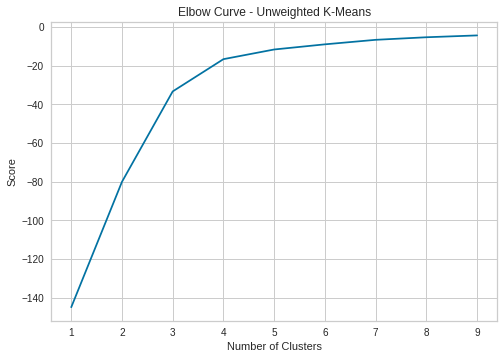

In [77]:
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')

plt.ylabel('Score')

plt.title('Elbow Curve - Unweighted K-Means')

plt.show()

Text(0.5, 1.0, 'Clustering  Unweighted')

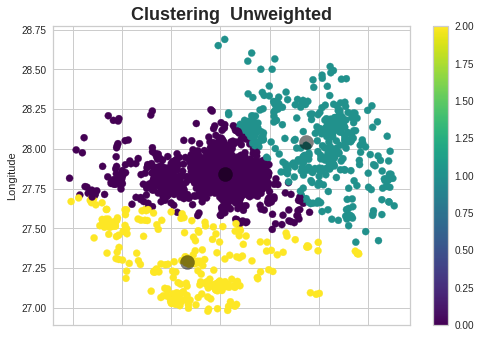

In [78]:

kmeans = KMeans(n_clusters = 3, init ='k-means++')
kmeans.fit(X[X.columns[1:3]]) # Compute k-means clustering.

X['cluster_label'] = kmeans.fit_predict(X[X.columns[0:2]])

centers = kmeans.cluster_centers_ # Coordinates of cluster centers.

labels = kmeans.predict(X[X.columns[0:2]]) # Labels of each point

#Visualise Resutls
X.plot.scatter(x = 'Latitude', y = 'Longitude', c=labels, s=50, cmap='viridis')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)
plt.title('Clustering  Unweighted',fontsize=18, fontweight='bold')

weighted kmeans


In [79]:
# Variable with the Longitude and Latitude
X_weighted =data2.loc[:,['Latitude','Longitude','Magnitude','Depth(km)']]

In [80]:
X_weighted.head(3)

,Latitude,Longitude,Magnitude,Depth(km)
0,39.0190,27.8095,1.3,17.2
1,39.4425,27.9402,1.5,4.8
3,39.0443,27.8400,2.1,8.7


In [81]:
K_clusters = range(1,10)

kmeans = [KMeans(n_clusters=i) for i in K_clusters]

lat_long = X_weighted[X_weighted.columns[1:3]]
lot_size = X_weighted[X_weighted.columns[3]]

sample_weight = lot_size

score = [kmeans[i].fit(lat_long, sample_weight = lot_size).score(lat_long) for i in range(len(kmeans))]

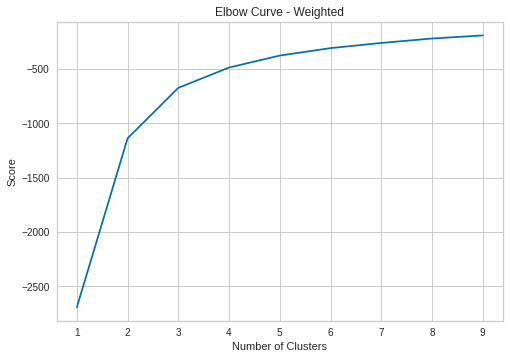

In [82]:
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')

plt.ylabel('Score')

plt.title('Elbow Curve - Weighted')

plt.show()

Text(0.5, 1.0, 'Clustering - Weighted')

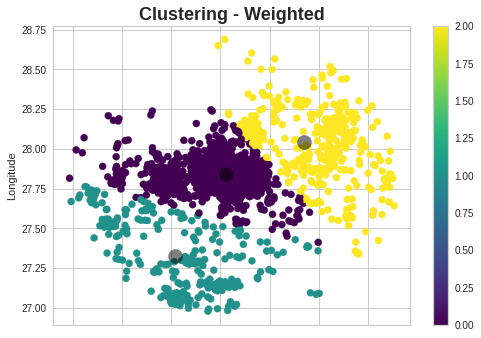

In [83]:
kmeans = KMeans(n_clusters = 3, max_iter=1000, init ='k-means++')

lat_long = X_weighted[X_weighted.columns[0:2]]
lot_size = X_weighted[X_weighted.columns[3]]
weighted_kmeans_clusters = kmeans.fit(lat_long, sample_weight = lot_size) # Compute k-means clustering.
X_weighted['cluster_label'] = kmeans.predict(lat_long, sample_weight = lot_size)

centers = kmeans.cluster_centers_ # Coordinates of cluster centers.

labels = X_weighted['cluster_label'] # Labels of each point

X_weighted.plot.scatter(x = 'Latitude', y = 'Longitude', c=labels, s=50, cmap='viridis')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)
plt.title('Clustering - Weighted',fontsize=18, fontweight='bold')

## Yeni sınırlamalar

In [87]:
data4=data2
data4.head()

,Date,Time,Latitude,Longitude,Depth(km),Magnitude,Distance(km),Date2,newDate,newDate2,cluster
0,1/1/2020,16:32:46.03,39.0190,27.8095,17.2,1.3,3.87,2020-01-01,2020-01-01,2020.000000,3
1,1/2/2020,04:15:33.22,39.4425,27.9402,4.8,1.5,44.60,2020-01-02,2020-01-02,2020.002732,2
3,1/2/2020,19:17:13.74,39.0443,27.8400,8.7,2.1,1.07,2020-01-02,2020-01-02,2020.002732,0
4,1/3/2020,09:20:58.09,39.2660,27.9043,5.0,2.0,24.83,2020-01-03,2020-01-03,2020.005464,1
5,1/3/2020,09:50:59.51,39.4650,27.9427,5.3,1.8,47.09,2020-01-03,2020-01-03,2020.005464,2


In [88]:
data4.shape

(7564, 11)

In [89]:
data4 = data4.drop(data4[data4['Magnitude'] < 1].index)

In [90]:
data4.shape

(7459, 11)

In [102]:
# Variable with the Longitude and Latitude
X_weighted =data4.loc[:,['Latitude','Longitude','Magnitude','Depth(km)']]

In [103]:
K_clusters = range(1,10)

kmeans = [KMeans(n_clusters=i) for i in K_clusters]

lat_long = X_weighted[X_weighted.columns[1:3]]
lot_size = X_weighted[X_weighted.columns[3]]

sample_weight = lot_size

score = [kmeans[i].fit(lat_long, sample_weight = lot_size).score(lat_long) for i in range(len(kmeans))]

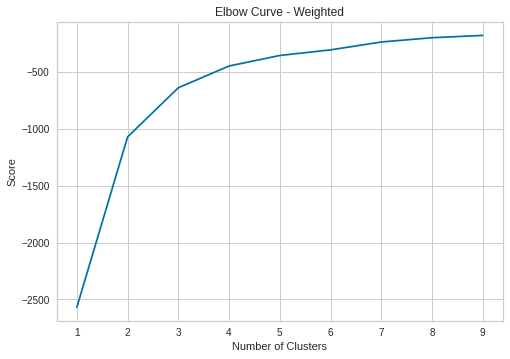

In [104]:
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')

plt.ylabel('Score')

plt.title('Elbow Curve - Weighted')

plt.show()

Text(0.5, 1.0, 'Clustering - Weighted')

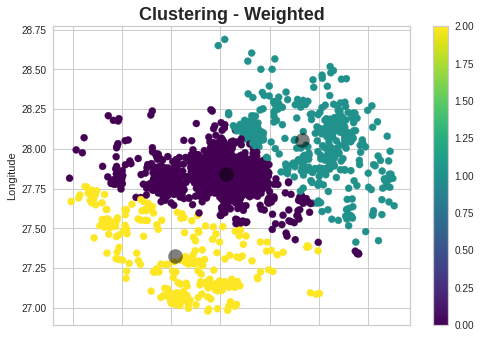

In [105]:
kmeans = KMeans(n_clusters = 3, max_iter=1000, init ='k-means++')

lat_long = X_weighted[X_weighted.columns[0:2]]
lot_size = X_weighted[X_weighted.columns[3]]
weighted_kmeans_clusters = kmeans.fit(lat_long, sample_weight = lot_size) # Compute k-means clustering.
X_weighted['cluster_label'] = kmeans.predict(lat_long, sample_weight = lot_size)

centers = kmeans.cluster_centers_ # Coordinates of cluster centers.

labels = X_weighted['cluster_label'] # Labels of each point

X_weighted.plot.scatter(x = 'Latitude', y = 'Longitude', c=labels, s=50, cmap='viridis')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)
plt.title('Clustering - Weighted',fontsize=18, fontweight='bold')

In [112]:
data4 = data4.drop(data4[data4['Longitude'] < 27.5].index)

In [114]:
data4 = data4.drop(data4[data4['Longitude'] > 28].index)

In [115]:
data4 = data4.drop(data4[data4['Latitude'] > 39].index)

In [116]:
data4 = data4.drop(data4[data4['Latitude'] < 38.5].index)

In [117]:
data4.shape

(2267, 11)

In [118]:
import numpy as np
from sklearn import preprocessing

DF_ARRAY = np.array(data4.iloc[:,3:7])          # Getting only the numeric features from the dataset
DF_NORM  = preprocessing.normalize(DF_ARRAY) # Normalizing the data

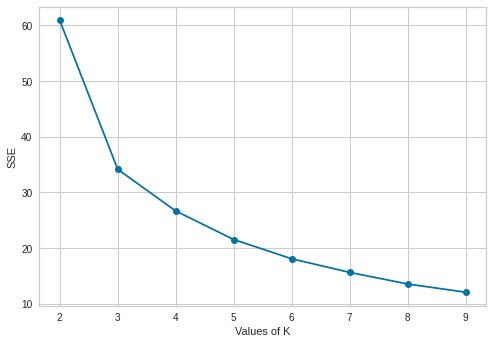

In [119]:
import matplotlib.pyplot as plt

# Amount of values to be tested for K
Ks = range(2, 10)

# List to hold on the metrics for each value of K
results = []

# Executing the loop
for K in Ks:
    
    model = KMeans(n_clusters = K)
    model.fit(DF_NORM)
    
    results.append(model.inertia_)

# Plotting the final result
plt.plot(Ks, results, 'o-')
plt.xlabel("Values of K")
plt.ylabel("SSE")
plt.show()

In [121]:
from sklearn.cluster import KMeans

# Creating our Model
kmeans = KMeans(n_clusters = 3)

# Training our model
kmeans.fit(DF_NORM)

# You can see the labels (clusters) assigned for each data point with the function labels_
kmeans.labels_

# Assigning the labels to the initial dataset
data4['cluster'] = kmeans.labels_

In [122]:
import plotly.graph_objects as go

PLOT = go.Figure()

for C in list(data4.cluster.unique()):
    
    PLOT.add_trace(go.Scatter3d(x = data4[data4.cluster == C]['Latitude'],
                                y = data4[data4.cluster == C]['Longitude'],
                                z = -data4[data4.cluster == C]['Magnitude'],
                                mode = 'markers', marker_size = 1,
                                name = 'Cluster ' + str(C)))


PLOT.update_layout(width = 800, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'Latitude', titlefont_color = 'black'),
                                yaxis=dict(title = 'Longitude', titlefont_color = 'black'),
                                zaxis=dict(title = 'Magnitude', titlefont_color = 'black')),
                   font = dict(family = "Gilroy", color  = 'black', size = 12))